In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import umap

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp
from External.generation import create_graph

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm

from numpy.linalg import norm

In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
plt.style.use('standard.mplstyle')

# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"

In [7]:
labels = pd.read_csv("~/Data/pancreas/obs.csv",header=0)
position = pd.read_csv("~/Data/pancreas/X.csv",header=None)

mask = labels.index[(labels['day'] <= 15.5) & 
                    ((labels["clusters_fig6_broad_final"] == "Ngn3 low EP") |
                     (labels["clusters_fig6_broad_final"] == "Ngn3 high EP") |
                     (labels["clusters_fig6_broad_final"] == "Fev+") |
                     (labels["clusters_fig6_broad_final"] == 'Delta') | 
                     (labels["clusters_fig6_broad_final"] ==  'Alpha') | 
                     (labels["clusters_fig6_broad_final"] ==  'Epsilon') | 
                     (labels["clusters_fig6_broad_final"] ==  'Beta') )]

unique_labels = list(labels.loc[mask]["clusters_fig6_broad_final"].unique())
labels = labels.loc[mask]["clusters_fig6_broad_final"].to_numpy()

position = position.loc[mask].to_numpy()

number_of_nodes = len(position)

print(f"Number of nodes = {len(position)}")
print(f"Number of dimensions = {len(position[0])}")

Number of nodes = 10176
Number of dimensions = 3999


In [8]:
# calculate the UMAP embedding. In the plots replace position with embedding

reducer = umap.UMAP(min_dist=0.8,random_state=42)
# scaled_data = StandardScaler().fit_transform(position)
scaled_data = position
embedding = reducer.fit_transform(scaled_data)

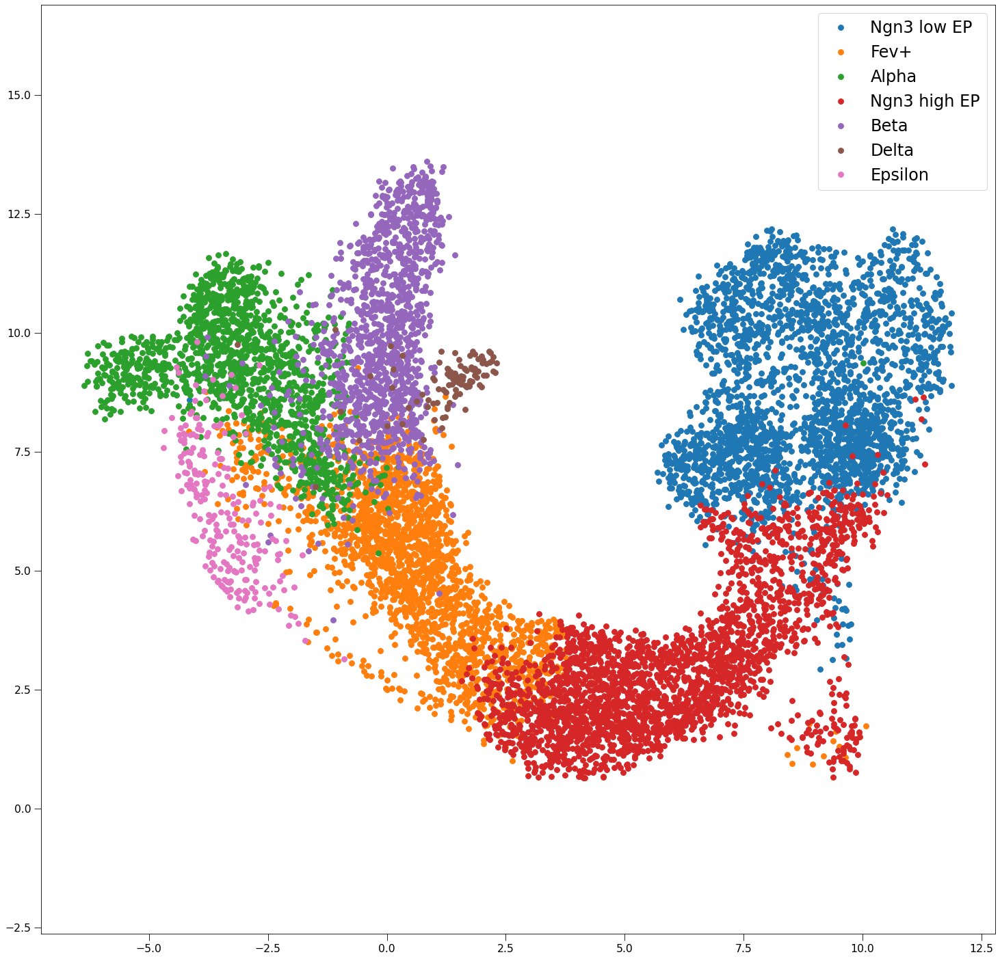

In [9]:
fig, ax = plt.subplots(1, figsize=(24,24))
for label in unique_labels:
    plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
ax.axis("equal")
plt.legend()
plt.show()

In [10]:
pos = StandardScaler().fit_transform(position)
pca = PCA(n_components=100).fit_transform(pos)

# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))
cluster_centers, labels = k_means_pp(k, position, metric=metric, return_labels=True)
unique_labels = np.unique(labels)

sklearn is done: 212.6952509880066
My own part is done: 40.43406367301941


In [11]:
components = []
for label in unique_labels:
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    components.append(component[0])

sub_ICTs = []
for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    # Only one node -> no graph possible
    if sub_number_of_nodes == 1:
        sub_G = nk.graph.Graph(n=1, weighted=True)
    
    # TODO: might not be the best solution
    elif sub_number_of_nodes <= 6:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=1,
                                beta=2, delta=0.5, bridges=1)
        sub_G.indexEdges()
        
    else:
        sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                                beta=2, delta=0.5, bridges=4)
        sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

update Arr 40 -> 33
update Arr 33 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 17
update Arr 17 -> 16
update Arr 16 -> 14



update Arr 267 -> 242
update Arr 242 -> 216
update Arr 216 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 139
update Arr 139 -> 125
update Arr 125 -> 113
update Arr 113 -> 101
update Arr 101 -> 90
update Arr 90 -> 86
update Arr 86 -> 79
added 2 edges early
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 77



update Arr 600 -> 539
added 2 edges early
update Arr 539 -> 489
update Arr 489 -> 439
update Arr 439 -> 399
update Arr 399 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 268
update Arr 268 -> 242
update Arr 242 -> 219
update Arr 219 -> 198
update Arr 198 -> 174
update Arr 174 -> 174
update Arr 174 -> 173
update Arr 173 -> 172
update Arr 172 -> 171
update Arr 171 -> 170
update Arr 170 -> 170
update Arr 170 -> 169



update Arr 137 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 68
update Arr 68 -> 61
update Arr 61 -> 54
update Arr 54 -> 47
update Arr 47 -> 47
update Arr 47 -> 46
update Arr 46 -> 45
update Arr 45 -> 43
update Arr 43 -> 40



update Arr 665 -> 603
added 3 edges early
update Arr 603 -> 546
update Arr 546 -> 489
update Arr 489 -> 443
update Arr 443 -> 402
update Arr 402 -> 363
update Arr 363 -> 328
update Arr 328 -> 297
update Arr 297 -> 268
update Arr 268 -> 242
update Arr 242 -> 219
update Arr 219 -> 199
update Arr 199 -> 191
update Arr 191 -> 185
added 3 edges early
update Arr 185 -> 185
update Arr 185 -> 184
update Arr 184 -> 184
update Arr 184 -> 183



update Arr 89 -> 77
update Arr 77 -> 64
update Arr 64 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 26



update Arr 1 -> 1



update Arr 687 -> 619
added 3 edges early
update Arr 619 -> 561
update Arr 561 -> 508
update Arr 508 -> 460
update Arr 460 -> 417
update Arr 417 -> 377
update Arr 377 -> 341
update Arr 341 -> 308
update Arr 308 -> 278
update Arr 278 -> 251
update Arr 251 -> 228
update Arr 228 -> 213
added 2 edges early
update Arr 213 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 210
update Arr 210 -> 209
update Arr 209 -> 208
update Arr 208 -> 205



update Arr 83 -> 72
update Arr 72 -> 65
update Arr 65 -> 59
update Arr 59 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 38
update Arr 38 -> 34
update Arr 34 -> 32
update Arr 32 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 24



update Arr 333 -> 302
added 2 edges early
update Arr 302 -> 273
update Arr 273 -> 246
update Arr 246 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 159
update Arr 159 -> 144
update Arr 144 -> 129
update Arr 129 -> 115
update Arr 115 -> 111
update Arr 111 -> 110
update Arr 110 -> 109
update Arr 109 -> 106
update Arr 106 -> 105
update Arr 105 -> 102
added 2 edges early
update Arr 102 -> 102



update Arr 468 -> 424
update Arr 424 -> 384
added 2 edges early
update Arr 384 -> 345
update Arr 345 -> 311
added 3 edges early
update Arr 311 -> 281
update Arr 281 -> 255
update Arr 255 -> 230
update Arr 230 -> 206
update Arr 206 -> 187
update Arr 187 -> 167
update Arr 167 -> 161
update Arr 161 -> 160
update Arr 160 -> 160
update Arr 160 -> 157
update Arr 157 -> 154
update Arr 154 -> 154
update Arr 154 -> 151
added 2 edges early



update Arr 5 -> 5
added 3 edges early



update Arr 1 -> 1



update Arr 237 -> 211
update Arr 211 -> 189
update Arr 189 -> 170
update Arr 170 -> 152
update Arr 152 -> 138
update Arr 138 -> 125
update Arr 125 -> 113
update Arr 113 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 75
update Arr 75 -> 74
update Arr 74 -> 73
update Arr 73 -> 71
update Arr 71 -> 70
update Arr 70 -> 69



update Arr 795 -> 720
update Arr 720 -> 647
update Arr 647 -> 588
update Arr 588 -> 534
update Arr 534 -> 484
update Arr 484 -> 438
update Arr 438 -> 397
update Arr 397 -> 358
update Arr 358 -> 323
update Arr 323 -> 292
update Arr 292 -> 265
update Arr 265 -> 238
update Arr 238 -> 228
update Arr 228 -> 228
update Arr 228 -> 227
update Arr 227 -> 226
update Arr 226 -> 225
update Arr 225 -> 225
update Arr 225 -> 224



update Arr 26 -> 23
update Arr 23 -> 17
update Arr 17 -> 14
update Arr 14 -> 13
update Arr 13 -> 11
update Arr 11 -> 10



update Arr 146 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 59
update Arr 59 -> 50
update Arr 50 -> 46
added 3 edges early
update Arr 46 -> 46



update Arr 1 -> 1



update Arr 117 -> 101
update Arr 101 -> 91
update Arr 91 -> 80
update Arr 80 -> 72
update Arr 72 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 46
update Arr 46 -> 43
update Arr 43 -> 38
update Arr 38 -> 37
update Arr 37 -> 36
update Arr 36 -> 35



update Arr 51 -> 45
update Arr 45 -> 40
update Arr 40 -> 35
update Arr 35 -> 31
update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 18
update Arr 18 -> 17



update Arr 44 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 25
update Arr 25 -> 21
update Arr 21 -> 19
update Arr 19 -> 19
update Arr 19 -> 18
update Arr 18 -> 16



update Arr 2 -> 2



update Arr 364 -> 328
update Arr 328 -> 292
update Arr 292 -> 262
update Arr 262 -> 238
update Arr 238 -> 215
update Arr 215 -> 194
update Arr 194 -> 176
update Arr 176 -> 157
update Arr 157 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 110
update Arr 110 -> 109
update Arr 109 -> 107
update Arr 107 -> 106
update Arr 106 -> 105
update Arr 105 -> 103



update Arr 299 -> 269
added 6 edges early
update Arr 269 -> 241
update Arr 241 -> 218
update Arr 218 -> 196
update Arr 196 -> 178
update Arr 178 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 95
update Arr 95 -> 94
update Arr 94 -> 88
update Arr 88 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 86



update Arr 1 -> 1



update Arr 293 -> 257
update Arr 257 -> 227
update Arr 227 -> 203
update Arr 203 -> 184
update Arr 184 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 106
update Arr 106 -> 96
update Arr 96 -> 88
update Arr 88 -> 83
update Arr 83 -> 83
update Arr 83 -> 82
update Arr 82 -> 81
update Arr 81 -> 80
update Arr 80 -> 79



update Arr 666 -> 602
added 3 edges early
update Arr 602 -> 546
added 2 edges early
update Arr 546 -> 492
update Arr 492 -> 447
update Arr 447 -> 406
update Arr 406 -> 368
update Arr 368 -> 334
update Arr 334 -> 301
update Arr 301 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 199
update Arr 199 -> 198
update Arr 198 -> 197
update Arr 197 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 191
update Arr 191 -> 191
update Arr 191 -> 190



update Arr 353 -> 304
update Arr 304 -> 267
update Arr 267 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 174
update Arr 174 -> 156
update Arr 156 -> 141
update Arr 141 -> 123
update Arr 123 -> 111
update Arr 111 -> 107
update Arr 107 -> 104
update Arr 104 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 100



update Arr 66 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 38
update Arr 38 -> 31
update Arr 31 -> 29
update Arr 29 -> 26
update Arr 26 -> 22
update Arr 22 -> 22
update Arr 22 -> 21
update Arr 21 -> 21
update Arr 21 -> 20



update Arr 418 -> 375
update Arr 375 -> 335
update Arr 335 -> 300
update Arr 300 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 200
update Arr 200 -> 181
update Arr 181 -> 164
update Arr 164 -> 148
update Arr 148 -> 130
added 2 edges early
update Arr 130 -> 129
update Arr 129 -> 125
update Arr 125 -> 125
update Arr 125 -> 123
update Arr 123 -> 123
update Arr 123 -> 122
update Arr 122 -> 121



update Arr 836 -> 744
added 2 edges early
update Arr 744 -> 673
update Arr 673 -> 609
added 2 edges early
update Arr 609 -> 553
update Arr 553 -> 501
update Arr 501 -> 455
update Arr 455 -> 412
update Arr 412 -> 372
update Arr 372 -> 338
update Arr 338 -> 307
update Arr 307 -> 278
update Arr 278 -> 250
update Arr 250 -> 243
update Arr 243 -> 238
update Arr 238 -> 238
update Arr 238 -> 237
update Arr 237 -> 236
update Arr 236 -> 236
update Arr 236 -> 235
update Arr 235 -> 234



update Arr 91 -> 76
update Arr 76 -> 67
update Arr 67 -> 60
update Arr 60 -> 53
update Arr 53 -> 48
update Arr 48 -> 43
update Arr 43 -> 37
update Arr 37 -> 36
update Arr 36 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29



update Arr 679 -> 610
update Arr 610 -> 541
added 2 edges early
update Arr 541 -> 491
update Arr 491 -> 445
update Arr 445 -> 403
update Arr 403 -> 366
update Arr 366 -> 331
update Arr 331 -> 299
update Arr 299 -> 271
update Arr 271 -> 245
update Arr 245 -> 222
update Arr 222 -> 209
update Arr 209 -> 205
added 3 edges early
update Arr 205 -> 205
update Arr 205 -> 204
update Arr 204 -> 203
update Arr 203 -> 202
update Arr 202 -> 201



update Arr 1039 -> 942
added 5 edges early
update Arr 942 -> 856
added 2 edges early
update Arr 856 -> 767
added 2 edges early
update Arr 767 -> 697
update Arr 697 -> 631
update Arr 631 -> 572
update Arr 572 -> 519
update Arr 519 -> 470
update Arr 470 -> 427
update Arr 427 -> 388
update Arr 388 -> 352
update Arr 352 -> 317
added 4 edges early
update Arr 317 -> 308
update Arr 308 -> 307
update Arr 307 -> 305
update Arr 305 -> 300
update Arr 300 -> 300
update Arr 300 -> 299
update Arr 299 -> 299



update Arr 105 -> 93
update Arr 93 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 44
update Arr 44 -> 41
update Arr 41 -> 40
update Arr 40 -> 37
update Arr 37 -> 35



update Arr 148 -> 134
update Arr 134 -> 113
update Arr 113 -> 102
update Arr 102 -> 92
update Arr 92 -> 83
update Arr 83 -> 73
update Arr 73 -> 66
update Arr 66 -> 57
update Arr 57 -> 54
update Arr 54 -> 52
update Arr 52 -> 49
update Arr 49 -> 48
update Arr 48 -> 47
update Arr 47 -> 46



update Arr 636 -> 574
update Arr 574 -> 511
update Arr 511 -> 464
added 2 edges early
update Arr 464 -> 421
update Arr 421 -> 380
update Arr 380 -> 344
update Arr 344 -> 311
update Arr 311 -> 280
update Arr 280 -> 254
update Arr 254 -> 229
update Arr 229 -> 208
update Arr 208 -> 189
update Arr 189 -> 188
update Arr 188 -> 182
added 2 edges early
update Arr 182 -> 182
update Arr 182 -> 181
update Arr 181 -> 180
update Arr 180 -> 180



update Arr 198 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 101
update Arr 101 -> 88
update Arr 88 -> 76
update Arr 76 -> 66
update Arr 66 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 62
update Arr 62 -> 61



update Arr 82 -> 74
update Arr 74 -> 65
update Arr 65 -> 56
update Arr 56 -> 50
update Arr 50 -> 43
update Arr 43 -> 39
update Arr 39 -> 35
update Arr 35 -> 33
update Arr 33 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 26



update Arr 665 -> 599
update Arr 599 -> 539
update Arr 539 -> 482
added 6 edges early
update Arr 482 -> 438
update Arr 438 -> 398
update Arr 398 -> 360
update Arr 360 -> 327
update Arr 327 -> 296
update Arr 296 -> 265
update Arr 265 -> 239
update Arr 239 -> 215
update Arr 215 -> 193
update Arr 193 -> 193
update Arr 193 -> 191
update Arr 191 -> 189
update Arr 189 -> 187
update Arr 187 -> 186
update Arr 186 -> 184



update Arr 575 -> 518
added 2 edges early
update Arr 518 -> 468
update Arr 468 -> 418
update Arr 418 -> 373
update Arr 373 -> 339
update Arr 339 -> 306
update Arr 306 -> 277
update Arr 277 -> 250
update Arr 250 -> 225
update Arr 225 -> 204
update Arr 204 -> 185
update Arr 185 -> 185
update Arr 185 -> 182
update Arr 182 -> 181
update Arr 181 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 176



update Arr 214 -> 188
update Arr 188 -> 163
update Arr 163 -> 147
update Arr 147 -> 133
update Arr 133 -> 118
update Arr 118 -> 107
update Arr 107 -> 94
update Arr 94 -> 84
update Arr 84 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
update Arr 72 -> 71
update Arr 71 -> 70
update Arr 70 -> 69
update Arr 69 -> 66
update Arr 66 -> 65



update Arr 63 -> 54
update Arr 54 -> 48
update Arr 48 -> 41
update Arr 41 -> 37
update Arr 37 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 23
update Arr 23 -> 22
update Arr 22 -> 21



update Arr 321 -> 287
update Arr 287 -> 258
update Arr 258 -> 234
update Arr 234 -> 210
update Arr 210 -> 189
update Arr 189 -> 171
update Arr 171 -> 152
update Arr 152 -> 136
update Arr 136 -> 121
update Arr 121 -> 108
update Arr 108 -> 104
update Arr 104 -> 102
update Arr 102 -> 100
update Arr 100 -> 97
update Arr 97 -> 97



update Arr 3 -> 3
added 2 edges early



update Arr 67 -> 59
update Arr 59 -> 49
update Arr 49 -> 43
update Arr 43 -> 39
update Arr 39 -> 33
update Arr 33 -> 31
update Arr 31 -> 30
update Arr 30 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 22



update Arr 658 -> 595
update Arr 595 -> 540
update Arr 540 -> 489
update Arr 489 -> 444
update Arr 444 -> 403
update Arr 403 -> 366
update Arr 366 -> 332
update Arr 332 -> 299
update Arr 299 -> 270
update Arr 270 -> 243
update Arr 243 -> 219
update Arr 219 -> 198
update Arr 198 -> 198
update Arr 198 -> 196
update Arr 196 -> 195
update Arr 195 -> 195
update Arr 195 -> 194
update Arr 194 -> 193
update Arr 193 -> 192



update Arr 4 -> 4
added 3 edges early



update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 21
update Arr 21 -> 18
update Arr 18 -> 14
update Arr 14 -> 13
update Arr 13 -> 11
update Arr 11 -> 10



update Arr 199 -> 178
update Arr 178 -> 159
update Arr 159 -> 144
update Arr 144 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 96
update Arr 96 -> 85
update Arr 85 -> 77
update Arr 77 -> 71
update Arr 71 -> 69
update Arr 69 -> 66
update Arr 66 -> 66
update Arr 66 -> 65
update Arr 65 -> 63



update Arr 796 -> 714
added 2 edges early
update Arr 714 -> 647
update Arr 647 -> 581
added 2 edges early
update Arr 581 -> 527
update Arr 527 -> 478
update Arr 478 -> 431
update Arr 431 -> 390
update Arr 390 -> 353
update Arr 353 -> 320
update Arr 320 -> 289
update Arr 289 -> 262
update Arr 262 -> 237
update Arr 237 -> 233
update Arr 233 -> 232
update Arr 232 -> 230
update Arr 230 -> 229
update Arr 229 -> 223
added 5 edges early



update Arr 352 -> 314
update Arr 314 -> 282
update Arr 282 -> 255
update Arr 255 -> 229
update Arr 229 -> 206
update Arr 206 -> 187
update Arr 187 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 117
added 5 edges early
update Arr 117 -> 111
update Arr 111 -> 106
update Arr 106 -> 106
update Arr 106 -> 104
update Arr 104 -> 103
update Arr 103 -> 103
update Arr 103 -> 102



update Arr 1096 -> 994
update Arr 994 -> 901
update Arr 901 -> 818
update Arr 818 -> 743
update Arr 743 -> 675
update Arr 675 -> 611
update Arr 611 -> 554
update Arr 554 -> 502
update Arr 502 -> 455
update Arr 455 -> 412
update Arr 412 -> 374
update Arr 374 -> 337
update Arr 337 -> 315
update Arr 315 -> 315
update Arr 315 -> 314
update Arr 314 -> 313
update Arr 313 -> 312
update Arr 312 -> 311
update Arr 311 -> 310
update Arr 310 -> 309
update Arr 309 -> 308



update Arr 612 -> 556
update Arr 556 -> 505
update Arr 505 -> 458
update Arr 458 -> 412
update Arr 412 -> 374
update Arr 374 -> 339
update Arr 339 -> 306
update Arr 306 -> 276
update Arr 276 -> 249
update Arr 249 -> 222
update Arr 222 -> 201
update Arr 201 -> 183
update Arr 183 -> 182
update Arr 182 -> 180
update Arr 180 -> 176
added 2 edges early
update Arr 176 -> 176
update Arr 176 -> 175



update Arr 1016 -> 922
added 3 edges early
update Arr 922 -> 812
added 5 edges early
update Arr 812 -> 736
update Arr 736 -> 669
update Arr 669 -> 608
update Arr 608 -> 551
update Arr 551 -> 499
update Arr 499 -> 453
update Arr 453 -> 408
update Arr 408 -> 370
added 2 edges early
update Arr 370 -> 336
update Arr 336 -> 302
added 3 edges early
update Arr 302 -> 290
update Arr 290 -> 289
update Arr 289 -> 282
update Arr 282 -> 282
update Arr 282 -> 281
update Arr 281 -> 281
update Arr 281 -> 280



update Arr 62 -> 49
update Arr 49 -> 44
update Arr 44 -> 39
update Arr 39 -> 35
update Arr 35 -> 30
update Arr 30 -> 29
update Arr 29 -> 27
update Arr 27 -> 26
update Arr 26 -> 25
update Arr 25 -> 24
update Arr 24 -> 22
update Arr 22 -> 21



update Arr 427 -> 385
update Arr 385 -> 347
update Arr 347 -> 315
update Arr 315 -> 284
update Arr 284 -> 257
update Arr 257 -> 232
update Arr 232 -> 209
added 3 edges early
update Arr 209 -> 189
update Arr 189 -> 171
update Arr 171 -> 153
update Arr 153 -> 136
update Arr 136 -> 135
update Arr 135 -> 134
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 132
update Arr 132 -> 131



update Arr 594 -> 536
update Arr 536 -> 479
update Arr 479 -> 432
update Arr 432 -> 391
update Arr 391 -> 355
update Arr 355 -> 322
update Arr 322 -> 292
update Arr 292 -> 265
update Arr 265 -> 239
update Arr 239 -> 217
update Arr 217 -> 196
update Arr 196 -> 180
update Arr 180 -> 174
update Arr 174 -> 174
update Arr 174 -> 173
update Arr 173 -> 173
update Arr 173 -> 172
update Arr 172 -> 171



update Arr 831 -> 745
added 2 edges early
update Arr 745 -> 677
added 3 edges early
update Arr 677 -> 614
added 2 edges early
update Arr 614 -> 558
update Arr 558 -> 507
update Arr 507 -> 459
update Arr 459 -> 416
update Arr 416 -> 376
update Arr 376 -> 339
update Arr 339 -> 308
update Arr 308 -> 279
update Arr 279 -> 250
added 3 edges early
update Arr 250 -> 245
update Arr 245 -> 245
update Arr 245 -> 239
added 2 edges early
update Arr 239 -> 239
update Arr 239 -> 237
update Arr 237 -> 236



update Arr 858 -> 779
update Arr 779 -> 707
update Arr 707 -> 633
update Arr 633 -> 574
update Arr 574 -> 520
update Arr 520 -> 472
update Arr 472 -> 429
update Arr 429 -> 387
update Arr 387 -> 349
update Arr 349 -> 317
update Arr 317 -> 287
update Arr 287 -> 260
update Arr 260 -> 254
update Arr 254 -> 253
update Arr 253 -> 251
update Arr 251 -> 249
update Arr 249 -> 248
update Arr 248 -> 247
update Arr 247 -> 246



update Arr 120 -> 106
update Arr 106 -> 96
update Arr 96 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 55
update Arr 55 -> 49
update Arr 49 -> 45
update Arr 45 -> 42
update Arr 42 -> 40
update Arr 40 -> 37
added 2 edges early



update Arr 525 -> 472
update Arr 472 -> 427
update Arr 427 -> 383
update Arr 383 -> 346
update Arr 346 -> 314
update Arr 314 -> 285
update Arr 285 -> 259
update Arr 259 -> 235
update Arr 235 -> 213
update Arr 213 -> 192
update Arr 192 -> 173
update Arr 173 -> 169
update Arr 169 -> 168
update Arr 168 -> 164
update Arr 164 -> 164
update Arr 164 -> 162
update Arr 162 -> 162
update Arr 162 -> 161



update Arr 134 -> 113
update Arr 113 -> 99
update Arr 99 -> 89
update Arr 89 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 53
update Arr 53 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
update Arr 45 -> 43
update Arr 43 -> 41
update Arr 41 -> 41
update Arr 41 -> 39



update Arr 1068 -> 962
update Arr 962 -> 870
update Arr 870 -> 785
update Arr 785 -> 713
update Arr 713 -> 647
update Arr 647 -> 587
update Arr 587 -> 533
update Arr 533 -> 484
update Arr 484 -> 436
update Arr 436 -> 396
update Arr 396 -> 359
update Arr 359 -> 326
update Arr 326 -> 308
update Arr 308 -> 308
update Arr 308 -> 302
added 3 edges early
update Arr 302 -> 302
update Arr 302 -> 301
update Arr 301 -> 301
update Arr 301 -> 300



update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 79
update Arr 79 -> 66
update Arr 66 -> 59
update Arr 59 -> 53
update Arr 53 -> 49
update Arr 49 -> 48
update Arr 48 -> 47
update Arr 47 -> 46
update Arr 46 -> 45
update Arr 45 -> 44



update Arr 2 -> 2



update Arr 99 -> 87
added 3 edges early
update Arr 87 -> 79
update Arr 79 -> 69
update Arr 69 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 40
update Arr 40 -> 37
update Arr 37 -> 35
update Arr 35 -> 33
update Arr 33 -> 32
update Arr 32 -> 31



update Arr 877 -> 797
update Arr 797 -> 713
added 2 edges early
update Arr 713 -> 646
added 3 edges early
update Arr 646 -> 582
added 2 edges early
update Arr 582 -> 529
update Arr 529 -> 480
update Arr 480 -> 435
update Arr 435 -> 394
update Arr 394 -> 357
update Arr 357 -> 324
update Arr 324 -> 294
update Arr 294 -> 266
update Arr 266 -> 258
added 2 edges early
update Arr 258 -> 258
update Arr 258 -> 257
update Arr 257 -> 256
update Arr 256 -> 254
update Arr 254 -> 253
update Arr 253 -> 253
update Arr 253 -> 252
update Arr 252 -> 251



update Arr 239 -> 209
update Arr 209 -> 183
added 2 edges early
update Arr 183 -> 164
update Arr 164 -> 149
update Arr 149 -> 135
update Arr 135 -> 120
update Arr 120 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 81
update Arr 81 -> 79
update Arr 79 -> 78
update Arr 78 -> 77
update Arr 77 -> 76
update Arr 76 -> 75



update Arr 676 -> 613
update Arr 613 -> 553
update Arr 553 -> 498
added 2 edges early
update Arr 498 -> 451
update Arr 451 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 306
update Arr 306 -> 277
update Arr 277 -> 251
update Arr 251 -> 226
update Arr 226 -> 205
update Arr 205 -> 200
update Arr 200 -> 200
update Arr 200 -> 199
update Arr 199 -> 198
update Arr 198 -> 198
update Arr 198 -> 197
update Arr 197 -> 195



update Arr 196 -> 175
update Arr 175 -> 159
added 2 edges early
update Arr 159 -> 143
update Arr 143 -> 128
update Arr 128 -> 116
update Arr 116 -> 104
update Arr 104 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 67
update Arr 67 -> 65
update Arr 65 -> 63
update Arr 63 -> 62
update Arr 62 -> 62



update Arr 51 -> 44
update Arr 44 -> 35
update Arr 35 -> 30
update Arr 30 -> 25
update Arr 25 -> 25
update Arr 25 -> 24
update Arr 24 -> 23
update Arr 23 -> 19
update Arr 19 -> 18
update Arr 18 -> 17
update Arr 17 -> 17



update Arr 23 -> 20
update Arr 20 -> 16
update Arr 16 -> 14
update Arr 14 -> 12
update Arr 12 -> 10
update Arr 10 -> 9



update Arr 402 -> 357
update Arr 357 -> 316
update Arr 316 -> 279
added 3 edges early
update Arr 279 -> 246
update Arr 246 -> 223
update Arr 223 -> 201
update Arr 201 -> 182
update Arr 182 -> 162
update Arr 162 -> 145
update Arr 145 -> 130
update Arr 130 -> 119
update Arr 119 -> 118
update Arr 118 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 112



update Arr 381 -> 340
update Arr 340 -> 307
update Arr 307 -> 279
update Arr 279 -> 252
update Arr 252 -> 227
update Arr 227 -> 206
update Arr 206 -> 185
update Arr 185 -> 168
update Arr 168 -> 144
added 2 edges early
update Arr 144 -> 125
update Arr 125 -> 114
update Arr 114 -> 114
update Arr 114 -> 114
update Arr 114 -> 113
update Arr 113 -> 112
update Arr 112 -> 111
update Arr 111 -> 110
update Arr 110 -> 108



update Arr 1227 -> 1108
added 3 edges early
update Arr 1108 -> 999
added 4 edges early
update Arr 999 -> 902
added 4 edges early
update Arr 902 -> 819
update Arr 819 -> 744
update Arr 744 -> 675
update Arr 675 -> 612
update Arr 612 -> 556
update Arr 556 -> 505
update Arr 505 -> 459
update Arr 459 -> 413
update Arr 413 -> 373
update Arr 373 -> 351
added 3 edges early
update Arr 351 -> 351
update Arr 351 -> 350
update Arr 350 -> 349
update Arr 349 -> 349
update Arr 349 -> 348



update Arr 212 -> 189
update Arr 189 -> 166
update Arr 166 -> 150
update Arr 150 -> 135
update Arr 135 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 77
update Arr 77 -> 71
update Arr 71 -> 70
update Arr 70 -> 68
update Arr 68 -> 67
update Arr 67 -> 65
update Arr 65 -> 64
update Arr 64 -> 64
update Arr 64 -> 62



update Arr 686 -> 623
update Arr 623 -> 562
update Arr 562 -> 498
added 2 edges early
update Arr 498 -> 452
update Arr 452 -> 410
update Arr 410 -> 371
update Arr 371 -> 335
update Arr 335 -> 303
update Arr 303 -> 275
update Arr 275 -> 248
update Arr 248 -> 225
added 2 edges early
update Arr 225 -> 202
update Arr 202 -> 201
update Arr 201 -> 200
update Arr 200 -> 199
update Arr 199 -> 199
update Arr 199 -> 198
update Arr 198 -> 198
update Arr 198 -> 197
update Arr 197 -> 196



update Arr 471 -> 427
update Arr 427 -> 388
update Arr 388 -> 350
added 2 edges early
update Arr 350 -> 318
update Arr 318 -> 287
update Arr 287 -> 260
update Arr 260 -> 236
update Arr 236 -> 213
update Arr 213 -> 192
update Arr 192 -> 174
update Arr 174 -> 158
update Arr 158 -> 148
update Arr 148 -> 147
update Arr 147 -> 144
update Arr 144 -> 142
update Arr 142 -> 142
update Arr 142 -> 141



update Arr 618 -> 561
added 2 edges early
update Arr 561 -> 505
update Arr 505 -> 457
update Arr 457 -> 414
update Arr 414 -> 375
update Arr 375 -> 340
update Arr 340 -> 306
update Arr 306 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 205
update Arr 205 -> 183
update Arr 183 -> 182
update Arr 182 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 175



update Arr 456 -> 412
update Arr 412 -> 368
update Arr 368 -> 332
update Arr 332 -> 301
update Arr 301 -> 271
update Arr 271 -> 246
update Arr 246 -> 223
update Arr 223 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 146
update Arr 146 -> 144
update Arr 144 -> 144
update Arr 144 -> 139
update Arr 139 -> 139
update Arr 139 -> 138
update Arr 138 -> 136
update Arr 136 -> 136
update Arr 136 -> 135



update Arr 120 -> 109
update Arr 109 -> 96
update Arr 96 -> 82
update Arr 82 -> 73
update Arr 73 -> 64
update Arr 64 -> 58
update Arr 58 -> 51
update Arr 51 -> 43
update Arr 43 -> 42
update Arr 42 -> 39
update Arr 39 -> 39



update Arr 130 -> 114
update Arr 114 -> 103
update Arr 103 -> 92
update Arr 92 -> 83
update Arr 83 -> 74
update Arr 74 -> 67
update Arr 67 -> 59
update Arr 59 -> 51
update Arr 51 -> 46
update Arr 46 -> 44
update Arr 44 -> 42
update Arr 42 -> 41
update Arr 41 -> 38



update Arr 607 -> 537
added 3 edges early
update Arr 537 -> 487
added 2 edges early
update Arr 487 -> 439
update Arr 439 -> 399
update Arr 399 -> 361
update Arr 361 -> 326
update Arr 326 -> 296
update Arr 296 -> 267
update Arr 267 -> 242
update Arr 242 -> 218
update Arr 218 -> 197
update Arr 197 -> 178
update Arr 178 -> 169
update Arr 169 -> 169
update Arr 169 -> 168
update Arr 168 -> 168
update Arr 168 -> 167
update Arr 167 -> 167
update Arr 167 -> 166



update Arr 198 -> 175
update Arr 175 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 117
update Arr 117 -> 106
update Arr 106 -> 95
update Arr 95 -> 83
update Arr 83 -> 71
update Arr 71 -> 67
update Arr 67 -> 66
update Arr 66 -> 65
update Arr 65 -> 62
update Arr 62 -> 62
update Arr 62 -> 60
update Arr 60 -> 58



update Arr 378 -> 337
update Arr 337 -> 303
update Arr 303 -> 275
update Arr 275 -> 247
update Arr 247 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 149
update Arr 149 -> 134
update Arr 134 -> 119
update Arr 119 -> 117
update Arr 117 -> 115
update Arr 115 -> 112
update Arr 112 -> 112
update Arr 112 -> 111



update Arr 1103 -> 1001
added 4 edges early
update Arr 1001 -> 903
update Arr 903 -> 816
update Arr 816 -> 740
update Arr 740 -> 672
update Arr 672 -> 610
update Arr 610 -> 554
update Arr 554 -> 503
update Arr 503 -> 456
update Arr 456 -> 414
update Arr 414 -> 376
update Arr 376 -> 341
update Arr 341 -> 332
update Arr 332 -> 330
update Arr 330 -> 329
update Arr 329 -> 325
added 2 edges early
update Arr 325 -> 325
update Arr 325 -> 324



update Arr 31 -> 28
update Arr 28 -> 25
update Arr 25 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 12
update Arr 12 -> 11
update Arr 11 -> 10



update Arr 84 -> 75
update Arr 75 -> 68
update Arr 68 -> 59
update Arr 59 -> 52
update Arr 52 -> 46
update Arr 46 -> 40
update Arr 40 -> 35
update Arr 35 -> 34
update Arr 34 -> 30
update Arr 30 -> 29
update Arr 29 -> 28
update Arr 28 -> 27
update Arr 27 -> 25



update Arr 795 -> 715
update Arr 715 -> 646
update Arr 646 -> 581
added 4 edges early
update Arr 581 -> 528
update Arr 528 -> 478
update Arr 478 -> 434
update Arr 434 -> 394
update Arr 394 -> 358
update Arr 358 -> 325
update Arr 325 -> 293
update Arr 293 -> 265
update Arr 265 -> 250
update Arr 250 -> 250
update Arr 250 -> 249
update Arr 249 -> 243
added 2 edges early
update Arr 243 -> 243
update Arr 243 -> 242
update Arr 242 -> 242



update Arr 426 -> 387
added 2 edges early
update Arr 387 -> 344
update Arr 344 -> 310
update Arr 310 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 168
update Arr 168 -> 152
update Arr 152 -> 138
update Arr 138 -> 131
update Arr 131 -> 131
update Arr 131 -> 128
update Arr 128 -> 128
update Arr 128 -> 127
update Arr 127 -> 124
update Arr 124 -> 124



update Arr 334 -> 303
added 2 edges early
update Arr 303 -> 272
update Arr 272 -> 247
update Arr 247 -> 224
update Arr 224 -> 202
update Arr 202 -> 183
update Arr 183 -> 164
update Arr 164 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 107
update Arr 107 -> 102
added 2 edges early
update Arr 102 -> 102
update Arr 102 -> 101
update Arr 101 -> 100
update Arr 100 -> 99



update Arr 344 -> 308
update Arr 308 -> 274
update Arr 274 -> 249
update Arr 249 -> 226
update Arr 226 -> 204
update Arr 204 -> 184
update Arr 184 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 119
update Arr 119 -> 108
update Arr 108 -> 107
update Arr 107 -> 106
update Arr 106 -> 105
update Arr 105 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 100



update Arr 460 -> 416
added 3 edges early
update Arr 416 -> 378
update Arr 378 -> 340
update Arr 340 -> 309
update Arr 309 -> 279
update Arr 279 -> 251
update Arr 251 -> 228
update Arr 228 -> 205
update Arr 205 -> 186
update Arr 186 -> 169
update Arr 169 -> 153
update Arr 153 -> 139
update Arr 139 -> 138
update Arr 138 -> 136
update Arr 136 -> 135
update Arr 135 -> 134
update Arr 134 -> 133
update Arr 133 -> 132



update Arr 484 -> 439
update Arr 439 -> 399
update Arr 399 -> 362
update Arr 362 -> 327
added 4 edges early
update Arr 327 -> 297
update Arr 297 -> 269
update Arr 269 -> 244
update Arr 244 -> 221
update Arr 221 -> 200
update Arr 200 -> 180
update Arr 180 -> 163
update Arr 163 -> 150
update Arr 150 -> 147
update Arr 147 -> 146
update Arr 146 -> 143
update Arr 143 -> 143



update Arr 262 -> 236
update Arr 236 -> 211
update Arr 211 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 136
update Arr 136 -> 123
update Arr 123 -> 111
update Arr 111 -> 99
update Arr 99 -> 89
update Arr 89 -> 85
update Arr 85 -> 82
update Arr 82 -> 82
update Arr 82 -> 81
update Arr 81 -> 79
update Arr 79 -> 77




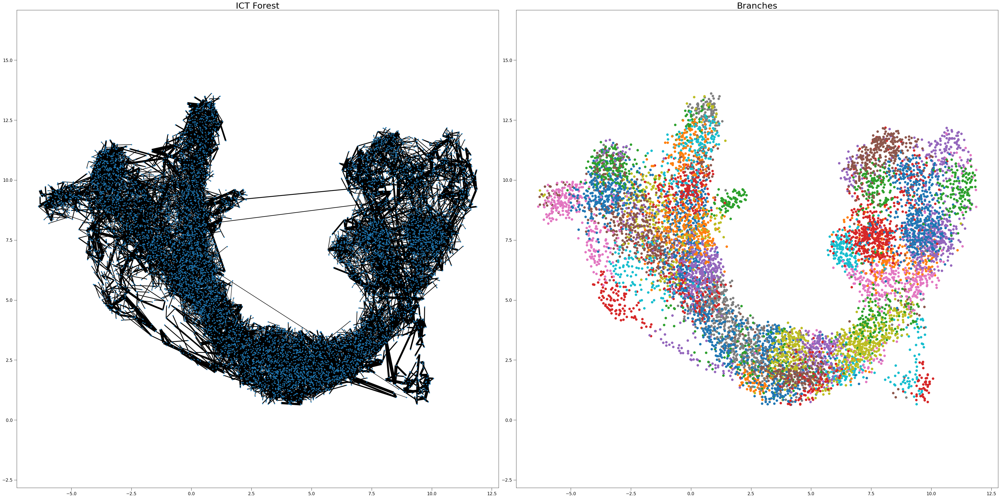

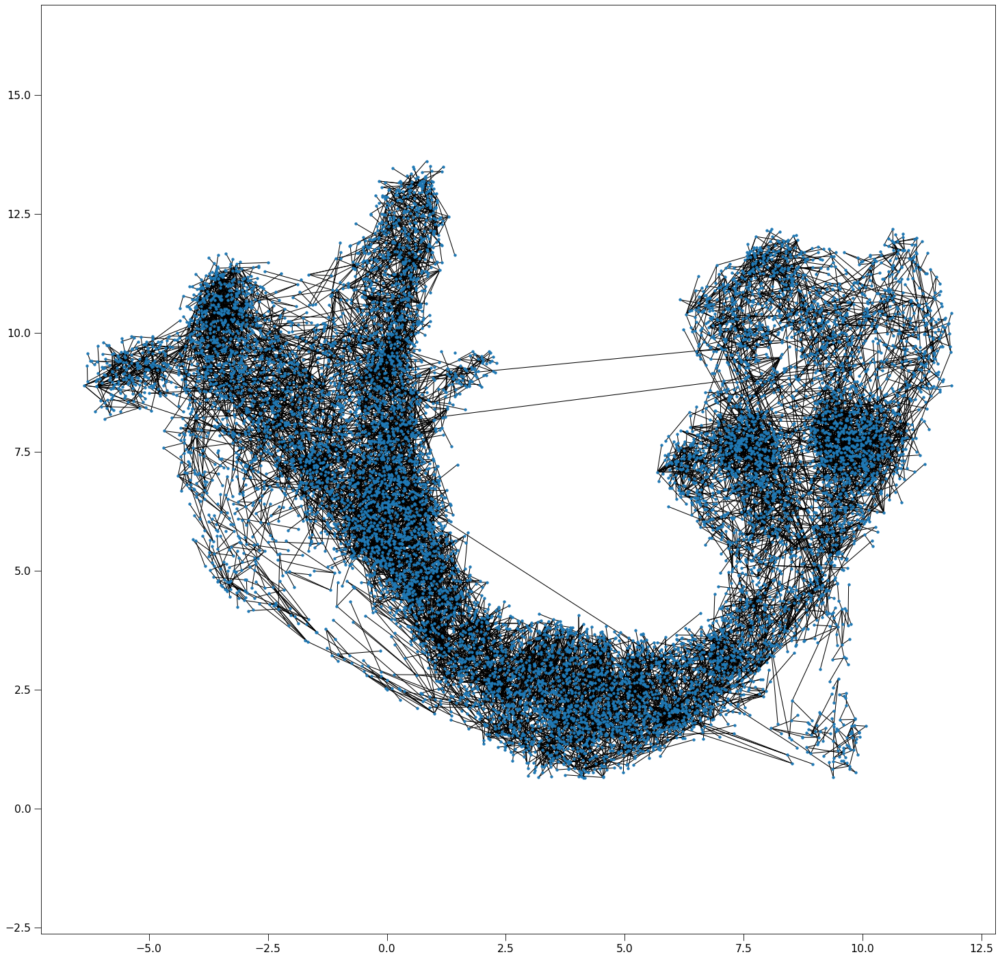

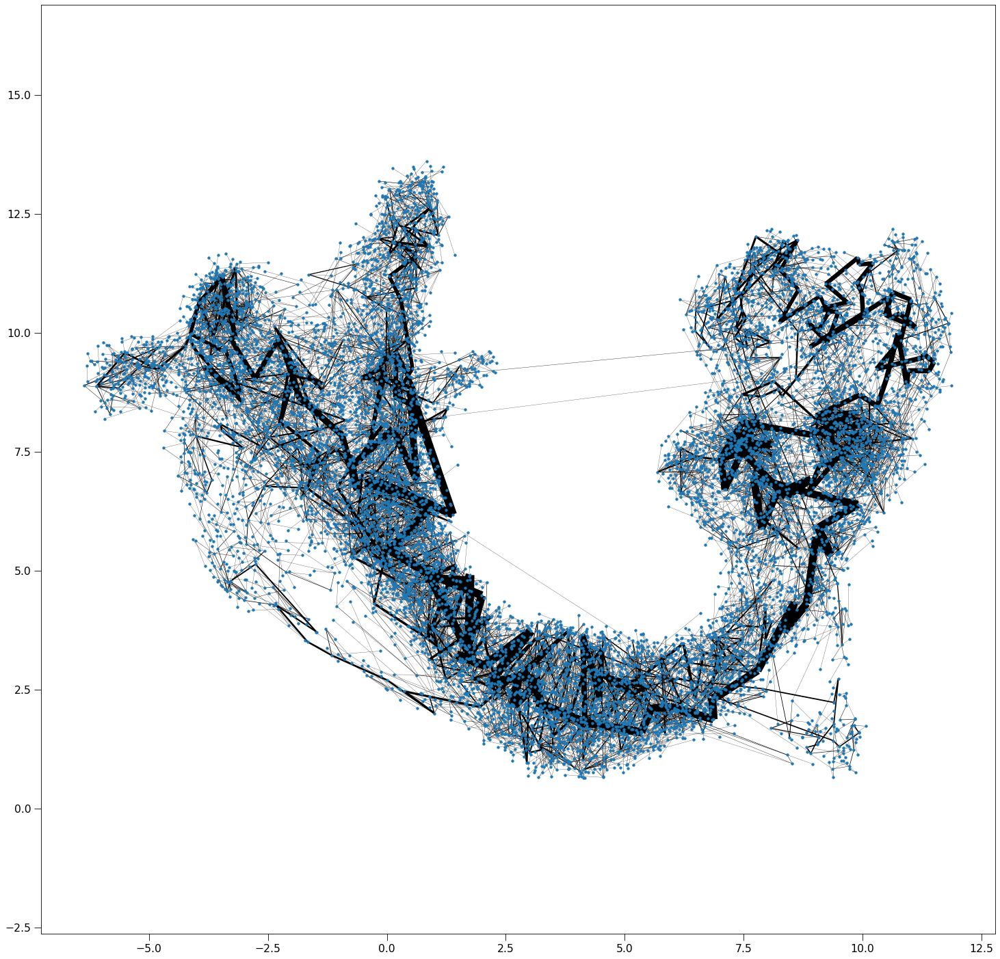

In [12]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [13]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT_cluster_all = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT_cluster_all.indexEdges()

# widths of the edges
widths_cluster_all = compute_widths(ICT_cluster_all)
print(time.time()-start)

update Arr 10175 -> 10175
added 6332 edges early
added 3842 edges early

3.3218398094177246


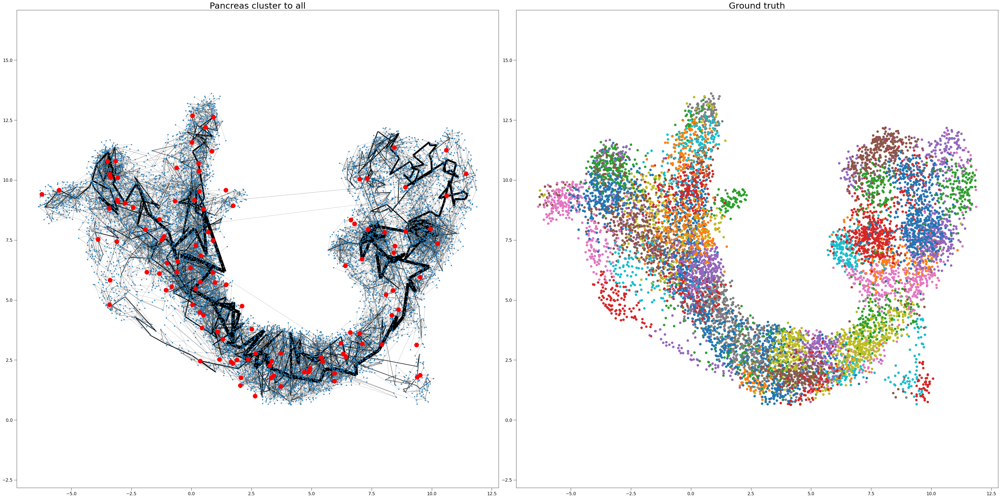

In [14]:
# plotting
graphs = [ICT_cluster_all]
widths = [widths_cluster_all]
names = ["Pancreas cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/pancreas-11-2-0_5")
plt.show()

In [15]:
dtae_embedding = pd.read_csv("~/Data/pancreas/embedding.csv",header=None)

dtae_embedding = dtae_embedding.loc[mask]

dtae_embedding = dtae_embedding.to_numpy()

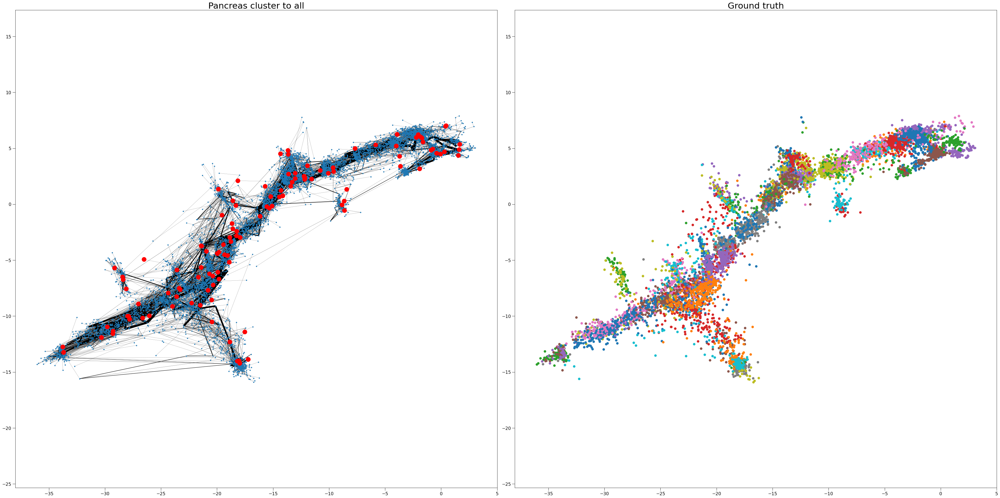

In [16]:
# plotting
graphs = [ICT_cluster_all]
widths = [widths_cluster_all]
names = ["Pancreas cluster to all", "Ground truth"]


number_of_plots = len(names)
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=dtae_embedding, ax=ax[i], width=widths[i], node_size=10)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
        ax[i].plot(*dtae_embedding[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
    else:
        for label in unique_labels:
            plt.plot(*dtae_embedding[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
    ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/pancreas-11-2-0_5-dtae-layout")
plt.show()

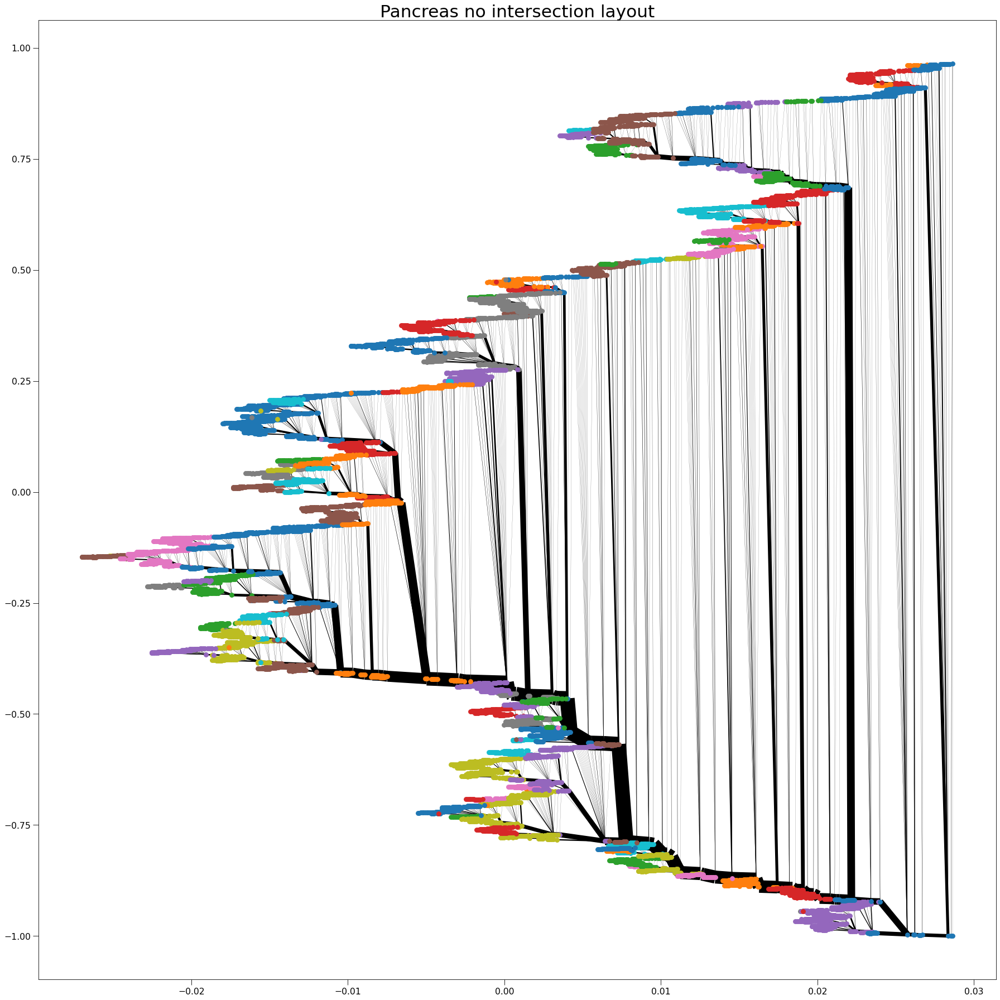

In [17]:
import networkx as nx
from copy import deepcopy
from numpy.linalg import norm
ICT = deepcopy(ICT_cluster_all)

for u, v in ICT.iterEdges():
    ICT.setWeight(u, v, norm(position[u] - position[v]))
    
ICT_nx = nk.nxadapter.nk2nx(ICT)

def arr_to_dict(arr):
    dct = {}
    for idx, elem in tqdm(enumerate(arr), desc="Create a dict from the position array"):
        dct[idx] = elem
    return dct

mapping = nx.planar_layout(ICT_nx)

mapping_ndarray = np.zeros((ICT.upperEdgeIdBound()+1,2))

# print(mapping_ndarray)

for key, val in zip(mapping.keys(), mapping.values()):
#     print(key)
    mapping_ndarray[key] = np.array([-val[1], -val[0]])
    
mapping = mapping_ndarray

# plotting
graphs = [ICT_cluster_all]
widths = [widths_cluster_all]
names = ["Pancreas no intersection layout", "Empty dataset"]


number_of_plots = 1
fig, ax = plt.subplots(1,1, figsize=(24,24))

if number_of_plots == 1:
    ax = [ax]
    
for i in range(number_of_plots):
    if i == 0:
        nk.viztasks.drawGraph(graphs[i], pos=mapping, ax=ax[i], width=np.array(widths[i])**1.3, node_size=0)
        ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
#         ax[i].plot(*mapping[cluster_centers].T, marker="o", color = "Red")
        ax[i].set_axis_on()
        for label in unique_labels:
            plt.plot(*mapping[np.argwhere(labels == label).T[0]].T, label=label)
    ax[i].set_title(names[i])
#     ax[i].axis("equal")
    
plt.tight_layout()
plt.savefig("./Output/Images/pancreas-11-2-0_5-no-intersections")
plt.show()